In [14]:
# configuration and imports
data_folder = "../../data/benchmarking/cellcount/"

workflow = "workflowB"

import utils
import matplotlib
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

font = {'family' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)

In [15]:
# load data

# the dataset contains 150 measurements of cell count in Drosophila melanogaster imaging data
# Furthermore, measurements exist for Laptop versus Workstation and ImageJ versus CLIJ

cell_count_clij_workstation = utils.read_all_measurements_from_file(data_folder + "myers-pc-22" + "_" + workflow + "_cellcount_clij.csv")
cell_count_clij_laptop = utils.read_all_measurements_from_file(data_folder + "myers-pc-21" + "_" + workflow + "_cellcount_clij.csv")
cell_count_imagej_workstation = utils.read_all_measurements_from_file(data_folder + "myers-pc-22" + "_" + workflow + "_cellcount_imagej.csv")
cell_count_imagej_laptop = utils.read_all_measurements_from_file(data_folder + "myers-pc-21" + "_" + workflow + "_cellcount_imagej.csv")


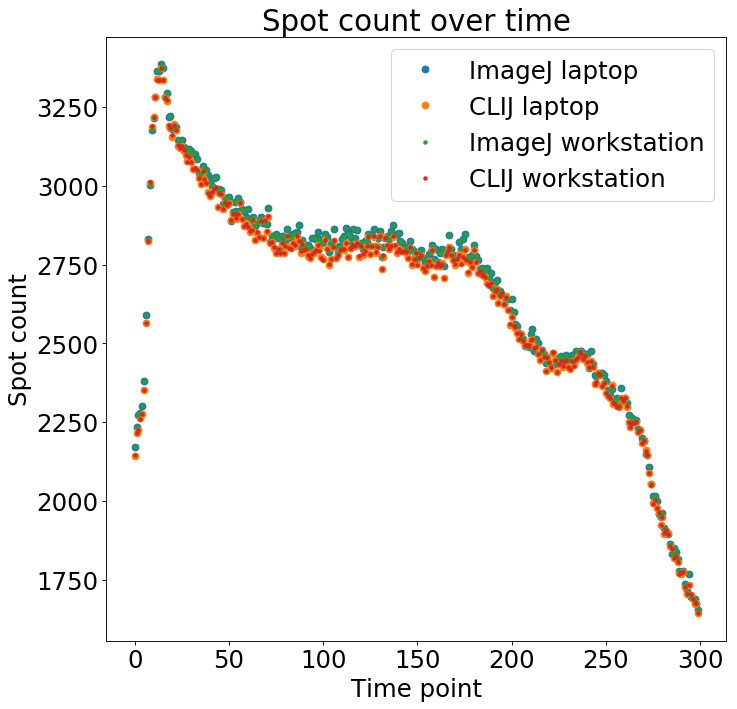

In [16]:
# plot number of spots over time for each sample
timepoints = range(0, len(cell_count_imagej_laptop))
plt.figure(figsize=(10, 10), dpi=80)
plt.plot(timepoints, cell_count_imagej_laptop, 'o')
plt.plot(timepoints, cell_count_clij_laptop, 'o')
plt.plot(timepoints, cell_count_imagej_workstation, '.')
plt.plot(timepoints, cell_count_clij_workstation, '.')

plt.legend(["ImageJ laptop", "CLIJ laptop", "ImageJ workstation", "CLIJ workstation"]) #, "CLIJ Workstation"])
plt.xlabel("Time point")
plt.ylabel("Spot count")
plt.title("Spot count over time")
plt.savefig("../images/spot_count_plot.png")
plt.show()

In [17]:
# some more definitions 
def compare(data1, data2, data1_name, data2_name):
    comparison_name = data1_name + "_versus_" + data2_name

    # Bland Altman analysis
    # https://www-users.york.ac.uk/~mb55/meas/ba.pdf

    utils.bland_altman_plot(data1, data2)

    plt.title('Bland-Altman Plot of spot count')
    plt.xlabel("Average spot count")
    plt.ylabel("Spot count " + data1_name + " - spot count " + data2_name)

    plt.savefig("../images/spot_count_" + comparison_name + "_bland_altman_plot.png")
    plt.show()

    # coefficient of repeatability (Bland Altman 1973)
    squared_differences = np.power(np.subtract(data1, data2), 2)


    CR = np.sqrt(np.sum(squared_differences) / len(squared_differences))

    print("Bland Altmans coefficient of repeatability: " + str(CR))

    ############################################################################3
    # Pearson correlation analysis

    plt.figure(figsize=(10, 10), dpi=80)
    plt.plot(data1, data2, 'o')
    plt.xlabel("Spot count " + data1_name)
    plt.ylabel("Spot count " + data2_name)
    plt.title("Spot count scatter plot")
    plt.savefig("../images/spot_count_" + comparison_name + "_scatter_plot.png")
    plt.show()

    # Pearsons correlation coefficient

    pcc = stats.pearsonr(data1, data2)

    print("Pearsons correlation coeficient: " + str(pcc[0]))

    #########################################################################
    # equivalence testing
    # check that relative difference is smaller than a given bound
    max_difference_bounds = 0.01

    differences = np.subtract(data1, data2)
    averages = np.divide(np.add(data1, data2), 2)

    relative_difference = np.abs(np.divide(differences, averages))
    print("Mean relative difference " + str(np.mean(relative_difference)))
    print("StdDev relative difference " + str(np.std(relative_difference)))

    t1, pv = stats.ttest_1samp(relative_difference, max_difference_bounds)

    print("Null-hypothesis: relative difference (" + comparison_name + ") is larger than " + str(max_difference_bounds * 100) + "%")
    print("alternative: relative difference (" + comparison_name + ") is smaller than "  + str(max_difference_bounds * 100) + "%")
    print("p value: " + str(pv))



ImageJ laptop versus CLIJ (laptop)
------------------


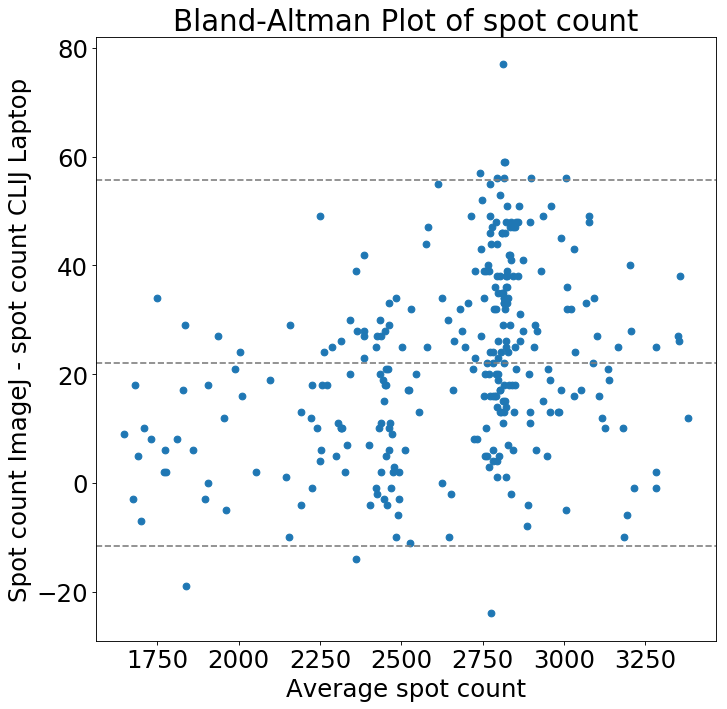

Bland Altmans coefficient of repeatability: 27.944588027022334


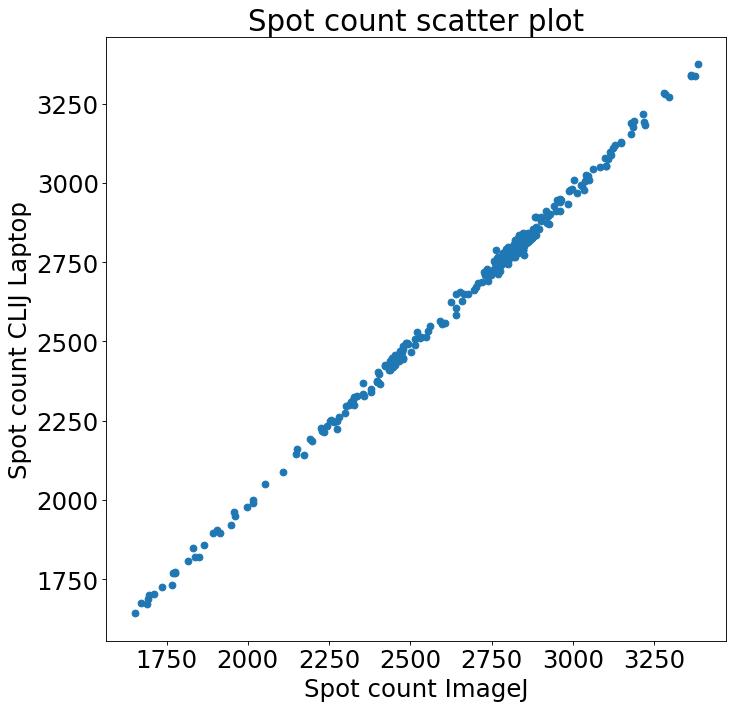

Pearsons correlation coeficient: 0.9989516830166467
Mean relative difference 0.008655364229211369
StdDev relative difference 0.005528286983689534
Null-hypothesis: relative difference (ImageJ_versus_CLIJ Laptop) is larger than 1.0%
alternative: relative difference (ImageJ_versus_CLIJ Laptop) is smaller than 1.0%
p value: 3.4417695774544065e-05


In [18]:
print("\nImageJ laptop versus CLIJ (laptop)")
print("------------------")
compare(cell_count_imagej_laptop, cell_count_clij_laptop, "ImageJ", "CLIJ Laptop")


ImageJ laptop versus CLIJ (workstation)
------------------


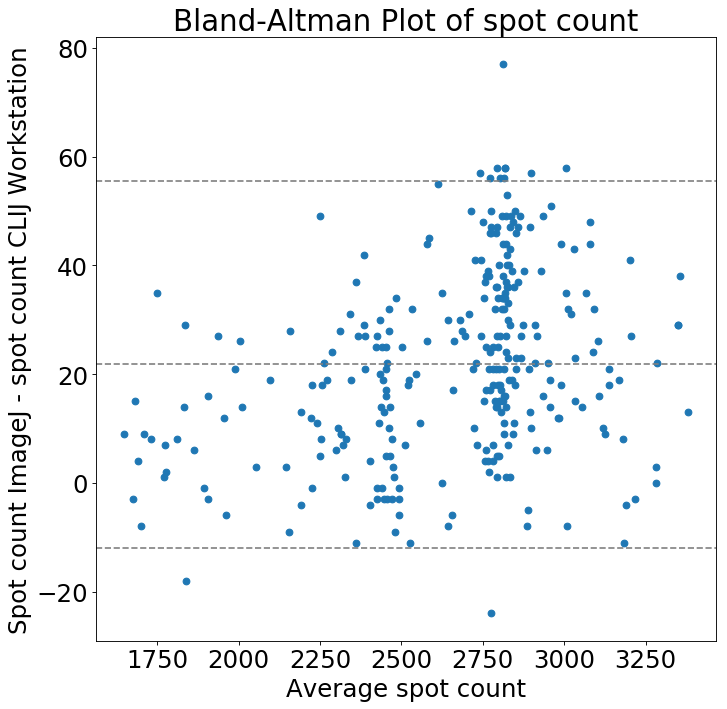

Bland Altmans coefficient of repeatability: 27.78800700542112


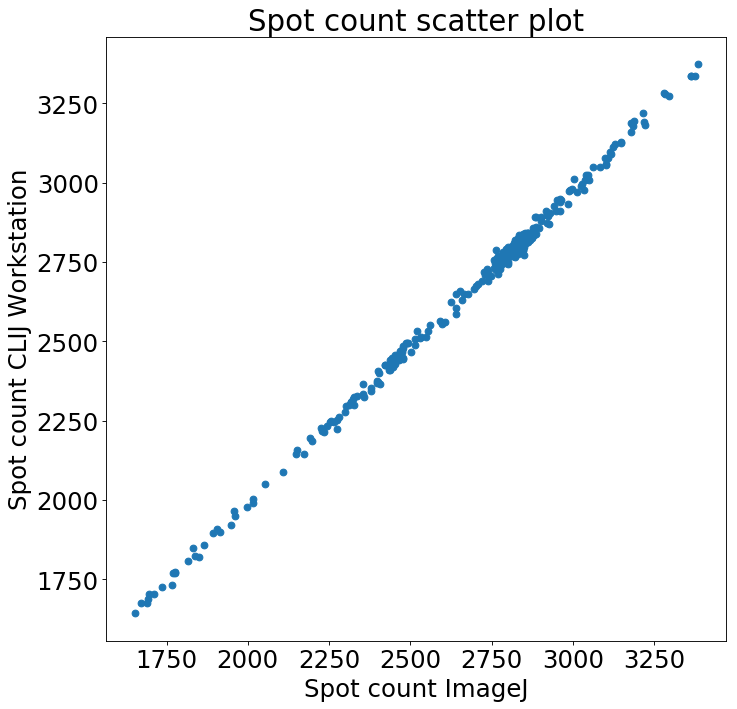

Pearsons correlation coeficient: 0.9989442215703946
Mean relative difference 0.00857516844377332
StdDev relative difference 0.0055353358383415634
Null-hypothesis: relative difference (ImageJ_versus_CLIJ Workstation) is larger than 1.0%
alternative: relative difference (ImageJ_versus_CLIJ Workstation) is smaller than 1.0%
p value: 1.2079981821340984e-05


In [19]:
print("\nImageJ laptop versus CLIJ (workstation)")
print("------------------")
compare(cell_count_imagej_laptop, cell_count_clij_workstation, "ImageJ", "CLIJ Workstation")


CLIJ laptop versus workstation
------------------------------


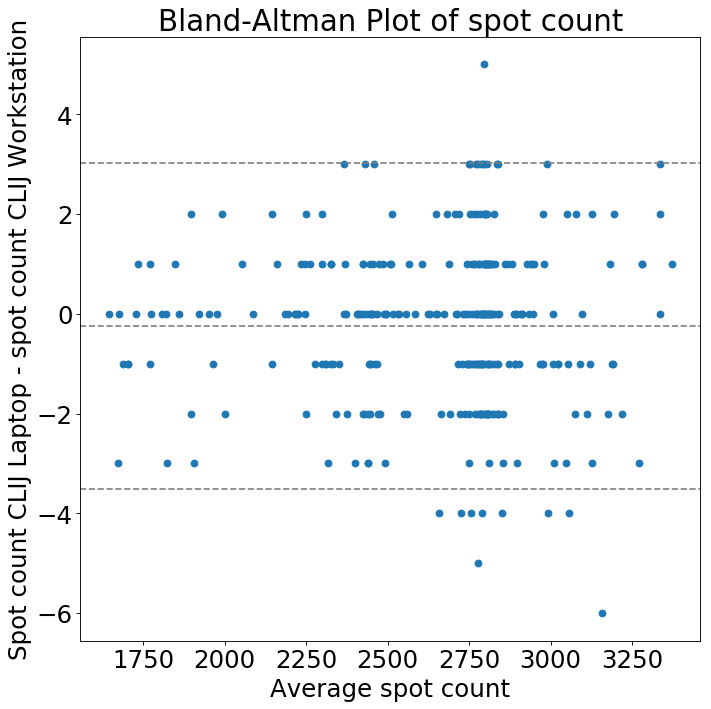

Bland Altmans coefficient of repeatability: 1.6852299546352716


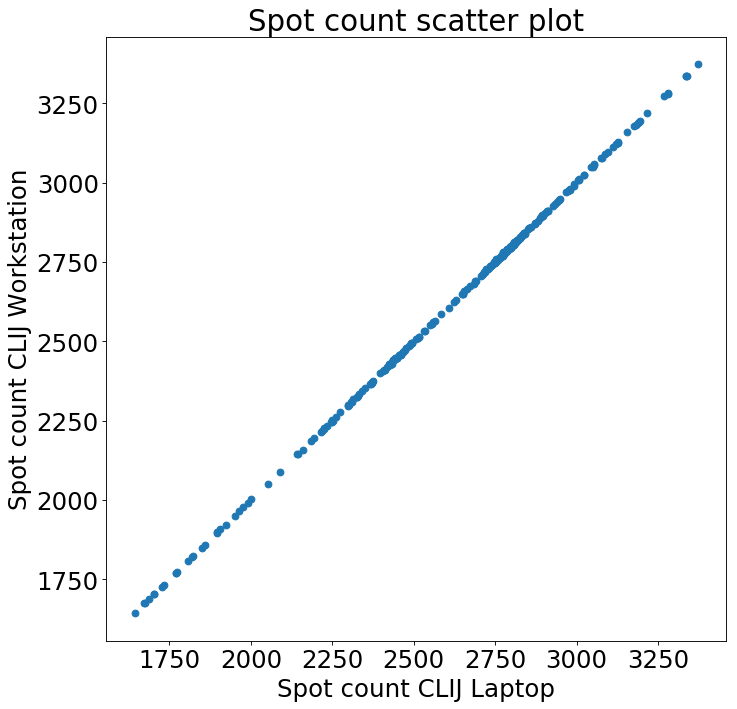

Pearsons correlation coeficient: 0.9999887786789626
Mean relative difference 0.00047871404458213224
StdDev relative difference 0.00041908495493092986
Null-hypothesis: relative difference (CLIJ Laptop_versus_CLIJ Workstation) is larger than 1.0%
alternative: relative difference (CLIJ Laptop_versus_CLIJ Workstation) is smaller than 1.0%
p value: 0.0


In [20]:
print("\nCLIJ laptop versus workstation")
print("------------------------------")
compare(cell_count_clij_laptop, cell_count_clij_workstation, "CLIJ Laptop", "CLIJ Workstation")



ImageJ laptop versus workstation
------------------------------


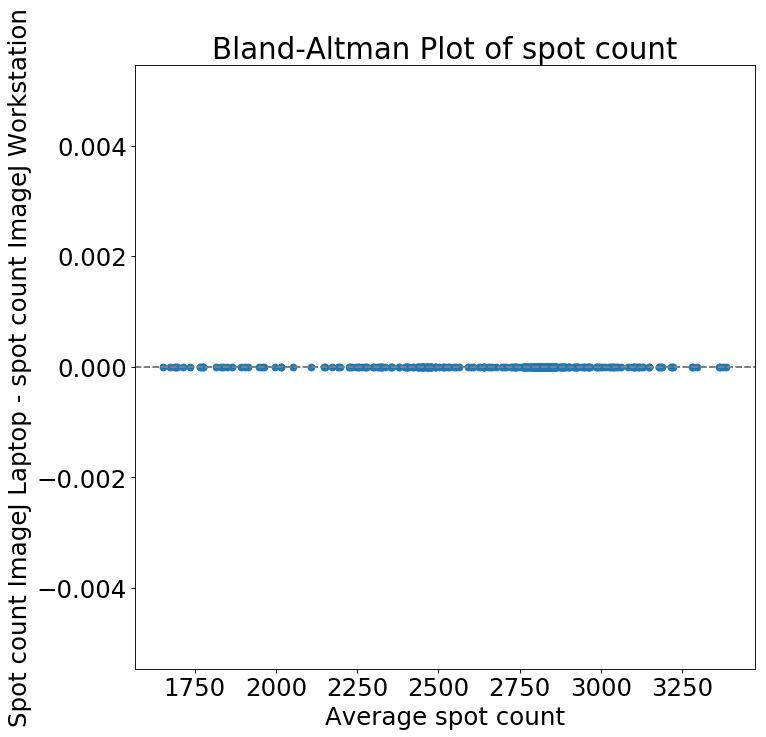

Bland Altmans coefficient of repeatability: 0.0


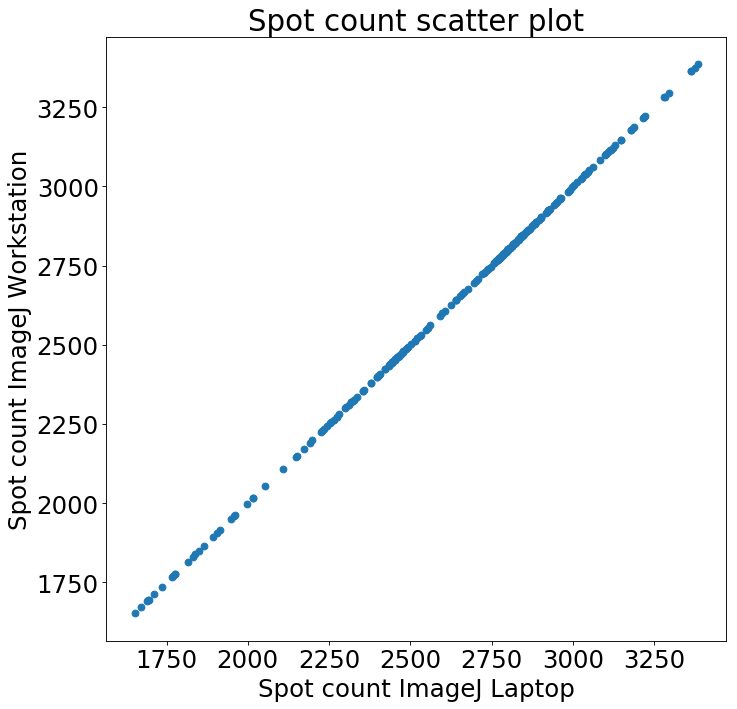

Pearsons correlation coeficient: 1.0
Mean relative difference 0.0
StdDev relative difference 0.0
Null-hypothesis: relative difference (ImageJ Laptop_versus_ImageJ Workstation) is larger than 1.0%
alternative: relative difference (ImageJ Laptop_versus_ImageJ Workstation) is smaller than 1.0%
p value: 0.0


In [21]:
print("\nImageJ laptop versus workstation")
print("------------------------------")
compare(cell_count_imagej_laptop, cell_count_imagej_workstation, "ImageJ Laptop", "ImageJ Workstation")


00000
00001
00002
00003
00004
00005
00006
00007
00008
00009
00010
00011
00012
00013
00014
00015
00016
00017
00018
00019
00020
00021
00022
00023
00024
00025
00026
00027
00028
00029
00030
00031
00032
00033
00034
00035
00036
00037
00038
00039
00040
00041
00042
00043
00044
00045
00046
00047
00048
00049
00050
00051
00052
00053
00054
00055
00056
00057
00058
00059
00060
00061
00062
00063
00064
00065
00066
00067
00068
00069
00070
00071
00072
00073
00074
00075
00076
00077
00078
00079
00080
00081
00082
00083
00084
00085
00086
00087
00088
00089
00090
00091
00092
00093
00094
00095
00096
00097
00098
00099
00100
00101
00102
00103
00104
00105
00106
00107
00108
00109
00110
00111
00112
00113
00114
00115
00116
00117
00118
00119
00120
00121
00122
00123
00124
00125
00126
00127
00128
00129
00130
00131
00132
00133
00134
00135
00136
00137
00138
00139
00140
00141
00142
00143
00144
00145
00146
00147
00148
00149
00150
00151
00152
00153
00154
00155
00156
00157
00158
00159
00160
00161
00162
00163
00164
00165
0016

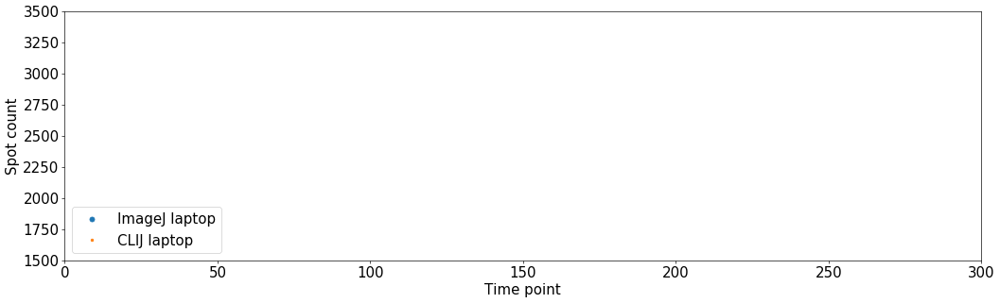

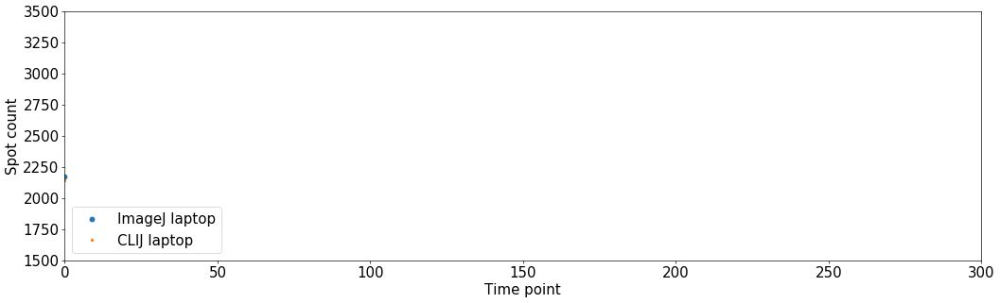

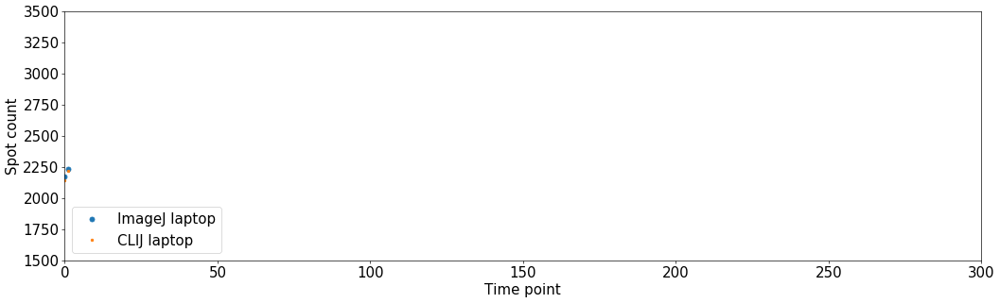

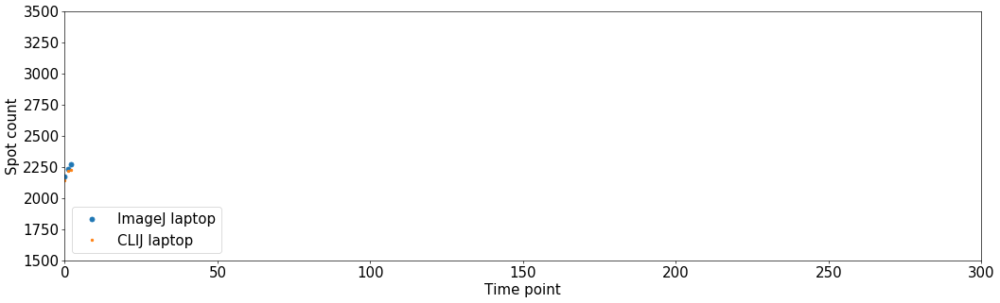

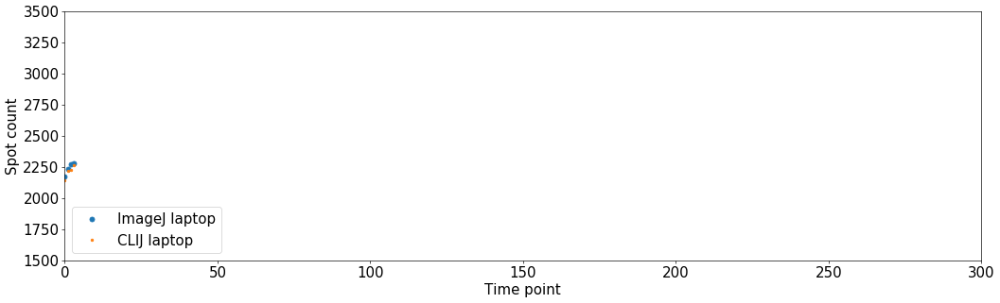

...

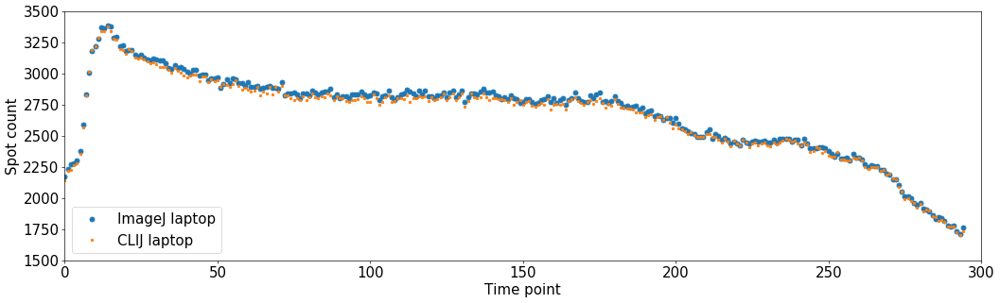

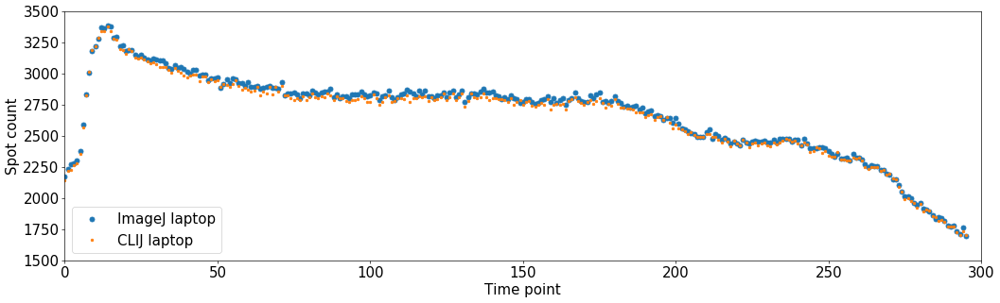

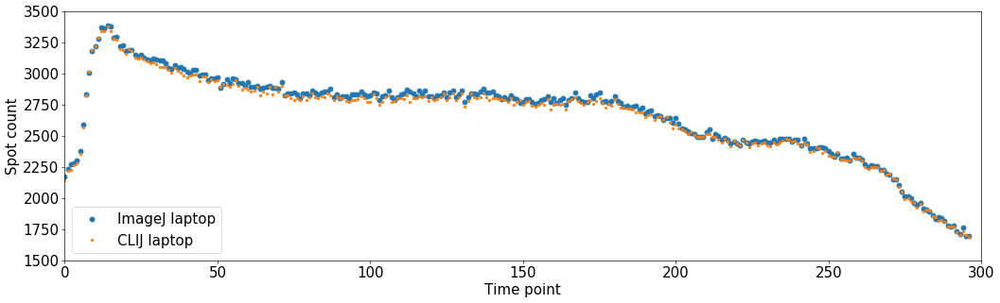

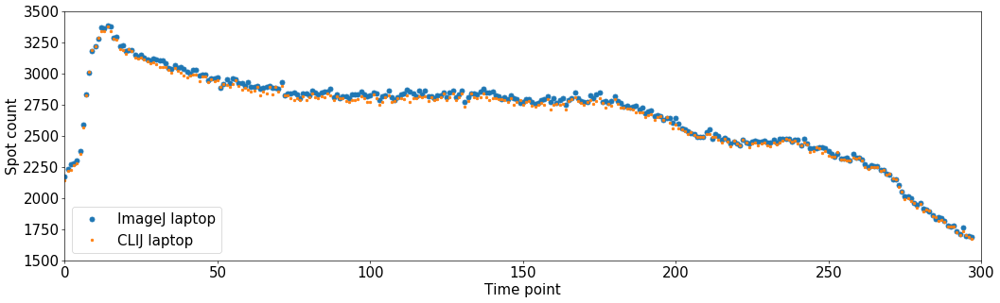

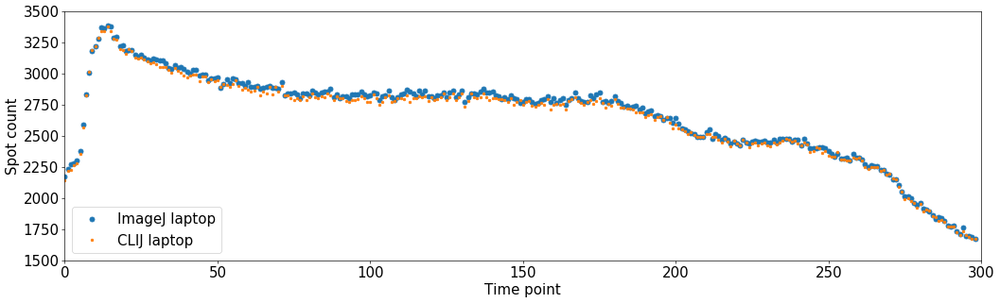

In [22]:
# generate changing plots over time
intended_figure_width = 1250
intended_figure_height = 350
intended_dpi = 60


font = {'family' : 'normal',
        'size'   : 18}

matplotlib.rc('font', **font)

for t in range(0, len(cell_count_imagej_laptop)):
#for t in range(0, 3):
    timepoints = range(0, len(cell_count_imagej_laptop[:t]))
    fig = plt.figure(figsize=(intended_figure_width / intended_dpi, intended_figure_height / intended_dpi), dpi=intended_dpi)
    plt.xlim(0, 300)
    plt.ylim(1500, 3500)
    
    plt.plot(timepoints, cell_count_imagej_laptop[:t], 'o')
    plt.plot(timepoints, cell_count_clij_laptop[:t], '.')
    #plt.plot(timepoints, cell_count_imagej_workstation[:t], '.')
    #plt.plot(timepoints, cell_count_clij_workstation[:t], '.')
    
    plt.legend(["ImageJ laptop", "CLIJ laptop", "ImageJ workstation", "CLIJ workstation"], loc='lower left') #, "CLIJ Workstation"])
    plt.xlabel("Time point")
    plt.ylabel("Spot count")
    #plt.title("Spot count over time")
    
    number = "00000" + str(t);
    print(number[-5:])
    plt.savefig("../images/spotcount_overtime/spot_count_plot_" + number[-5:] + ".png")
    # plt.show()